# L18 Computer Vision and Color Space

> Learn how to use **gradient thresholds** and **different color spaces** to more easily **identify lane markings** on the road

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [ ]:
def show_two_images(images, titles):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(images[0], cmap='gray')
    ax1.set_title(titles[0], fontsize=50)

    ax2.imshow(images[1], cmap='gray')
    ax2.set_title(titles[1], fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [153]:
def show_multi_images(images, titles, rows, cols):
    f, axes = plt.subplots(rows, cols, figsize=(50, 40))
    if rows == 1:
        axes = [axes]
    f.tight_layout()
    
    idx = 0
    for image, title in zip(images, titles):
        i = idx // cols
        j = idx % cols
        axes[i][j].imshow(image, cmap='gray')
        axes[i][j].set_title(title, fontsize=50)
        axes[i][j].set_xticks([])
        axes[i][j].set_yticks([])
        idx += 1
    plt.subplots_adjust(left=0., right=1, top=1.5, bottom=0.0)

## 1.Gradient Threshold

`Canny` 边缘检测很适合用于寻找图像中所有可能的线条，但对于车道检测，这种方法会使我们得到大量的来自景物、汽车以及其它物体的边缘，最终不得不丢弃许多检测结果。

车道线的特征：在图像中接近于**垂直线**，我们可以利用梯度来**检测斜率较大的边缘**，它们更可能是车道线

## 2.Sobel Operator

`Sobel` 算子是 Canny edge detection 算法的核心。

在图片中应用 `Sobel` 算子是一种计算图片在 x 和 y 方向上的斜率的方法. 

$Sobel_{x}$ 和 $Sobel_{y}$ 算子示例如下(kernel_size=3):
![](images/sobel-operator.png)

about `kernel_size`:
- 3 is the minimun size, but the `kernel_size` can be any odd number.
- A larger kernel implies taking the gradient over a larger region of the image(a smoother gradient)

---

梯度计算的方法:

$gradient = \sum{region}*{S_{x}}$

---

OpenCV 用法:
```
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
```

## 3.Applying Sobel

In [60]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Apply cv2.Sobel()
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    # Take the absolute value of the output from cv2.Sobel()
    abs_sobel = np.absolute(sobel)
    
    # Scale the result to an 8-bit range (0-255)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # Apply lower and upper thresholds
    binary_output = np.zeros_like(scaled_sobel)
    
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    # Create binary_output
    return binary_output

In [63]:
image = mpimg.imread('images/signs_vehicles_xygrad.png')
grad_binary_x = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
grad_binary_y = abs_sobel_thresh(image, orient='y', thresh=(20, 100))

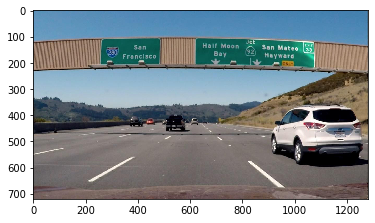

In [64]:
plt.imshow(image)

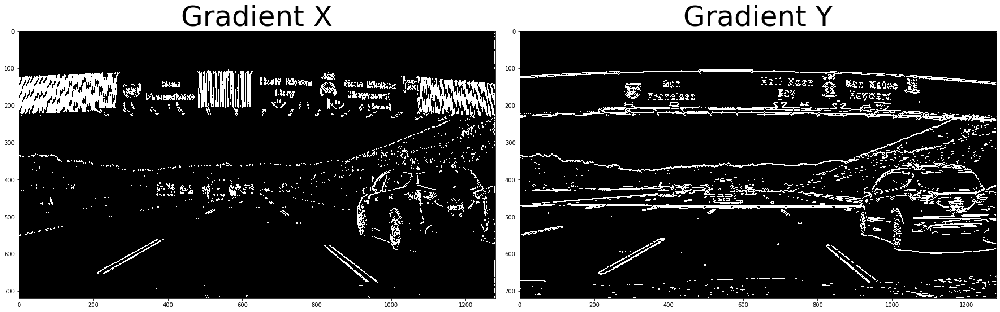

In [66]:
show_two_images([grad_binary_x, grad_binary_y], ['Gradient X', 'Gradient Y'])

## 4.Magnitude of the Gradient

In [44]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude
    mag_sobel = np.sqrt(sobel_x**2, sobel_y**2)
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255 * mag_sobel / np.max(mag_sobel))
    
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return binary_output

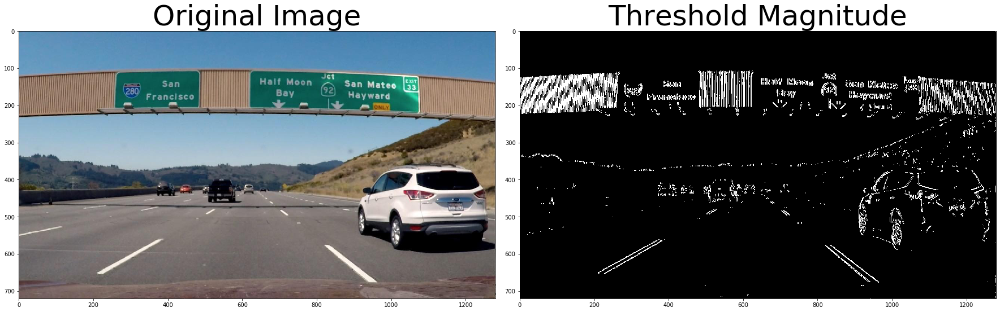

In [50]:
image = mpimg.imread('images/signs_vehicles_xygrad.png')
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
show_two_images([image, mag_binary], ['Original Image', 'Threshold Magnitude'])


## 5.Direction of the Gradient

梯度的方向计算: $arctan(\frac{sobel_{y}}{sobel_{x}})$ , 

因为对`sobel_x` 和 `sobel_y` 取了绝对值, 所以梯度方向的取值范围是 $(-\frac{2}{\pi}, \frac{2}{\pi})$


下面用 `np.arctan2()` 来计算梯度方向

In [51]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobel_y, abs_sobel_x)
    
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(gray)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return binary_output

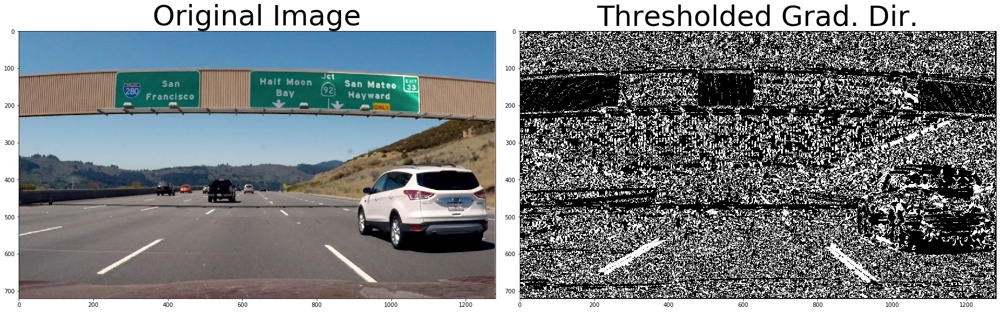

In [58]:
image = mpimg.imread('images/signs_vehicles_xygrad.png')
mag_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
show_two_images([image, mag_binary], ['Original Image', 'Thresholded Grad. Dir.'])


## 6.Combine Thresholds

从上面的图可以看到, 通过 `gradient direction` 我们可以检测到车道线，但是结果依旧有很多噪声

思考, 如何去结合 `magnitude gradient` 和 `gradient direction` 来更好地分离出车道线



In [73]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

Text(0.5, 1.0, 'Combined')

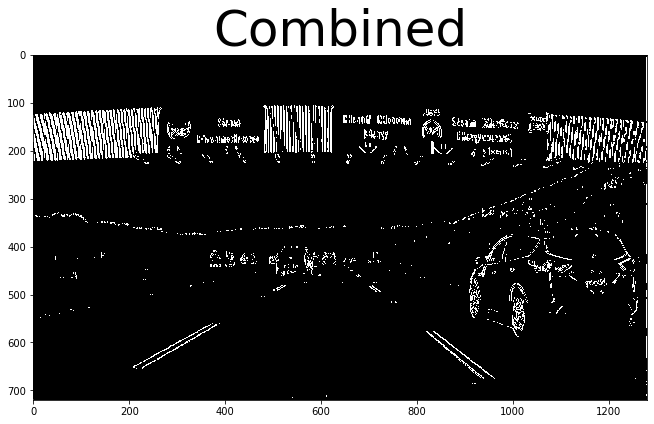

In [79]:
plt.figure(figsize=(11, 10))
plt.imshow(mag_binary, cmap='gray')
plt.title('Combined', fontsize=50)

## 7.Color Space

除灰度以为，其它色彩空间给我们提供了更多的图像信息

**RGB** 颜色空间, WHITE=(255, 255, 255)
<img src='images/RGB.png' height=240 width=240>

---

- RGB 阈值处理对检测白色车道线的像素有效
- 但是在不同光线条件的车道线中或车道颜色为黄色时，RGB阈值处理效果不佳
- `R` 和 `G` 通道对于分离白色和黄色的车道线有效, 但是`B` 通道不能检测黄色的车道线
- 下图中，图像靠后区域亮度不同，红色和绿色分量发生了变化，在阴影区域的值变得更低，并且在很亮的情况下，不能连续地识别出车道线.(**All channels vary under different levels of brightness**)
<img src='images/RGB2.png' height=450 width=600>




**HSV 和 HSL 颜色空间**
- HSV(hue, saturation, value)
- HSL(hue, lightness, saturation)

从下图中可以看到
- `Hue` 表示颜色的值, 与亮度的变化没有关系, `[0, 179]`
- `Lightness` 和 `Value` 表示颜色的亮暗程度
- `Saturation` 是对色彩(colorfulness)的衡量
<img src='images/HSV-HLS.png' height=400 width=600>

HLS Color Space
- ISOLATES THE LIGHTNESS(L) COMPONENT, WHICH VARIES THE MOST UNDER DIFFERENT LIGHTING CONDITIONS
- H AND S CHANNELS STAY FAIRLY CONSISTENT IN SHADOW OR EXCESSIVE BRIGHTNESS

以 HLS 色彩空间为例
- 这种色彩空间可区分出图像中每个像素的亮度值，L分量在不同的照明条件下，取值变化最大。
- H 和 S 通道在阴影或过亮的情况下，几乎保持不变。
- **我们可以只使用H和S通道，舍弃L通道，就能检测到不同颜色的车道线，而且比使用RGB色彩空间更可靠**

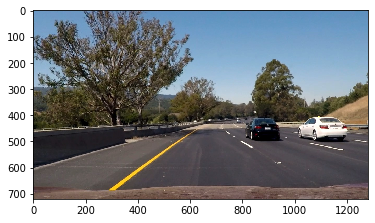

In [93]:
image = mpimg.imread('images/colorspace_test_images/test6.jpg')
plt.imshow(image)

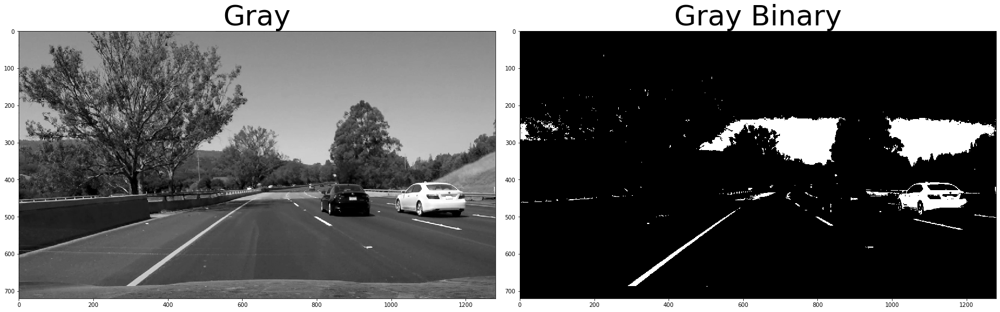

In [122]:
thresh = (180, 255)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

gray_binary = np.zeros_like(gray)
gray_binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
show_two_images([gray, gray_binary], ['Gray', 'Gray Binary'])

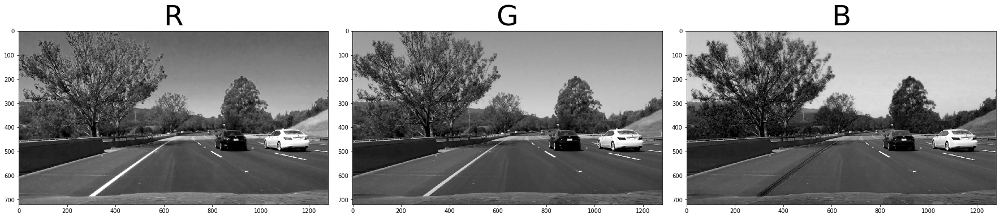

In [105]:
R = image[:, :, 0]
G = image[:, :, 1]
B = image[:, :, 2]
show_multi_images([R, G, B], ['R', 'G', 'B'], 1, 3)

从上图可以看出，R 通道对车道线最为突出，设置阈值来找到车道线的像素

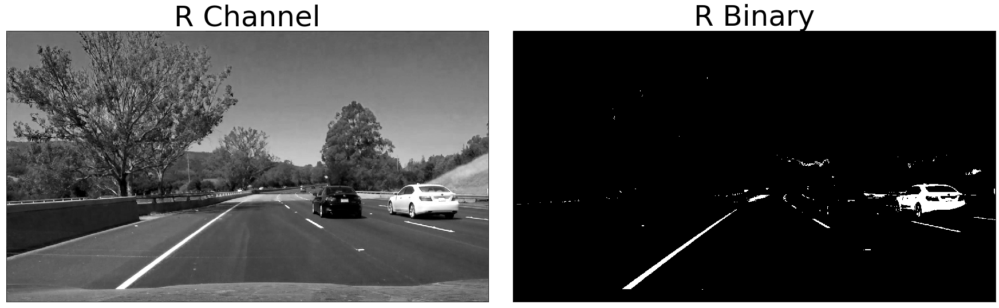

In [119]:
R_thresh = (200, 255)
R_binary = np.zeros_like(R)
R_binary[(R > R_thresh[0]) & (R <= R_thresh[1])] = 1
show_multi_images([R, R_binary], ['R Channel', 'R Binary'], 1, 2)

接下来试试对 HLS 通道的效果

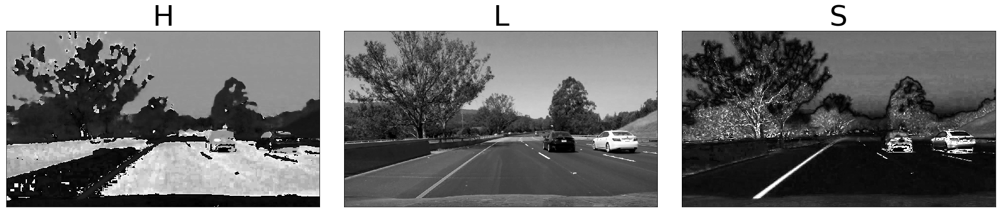

In [111]:
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:, :, 0]
L = hls[:, :, 1]
S = hls[:, :, 2]

show_multi_images([H, L, S], ['H', 'L', 'S'], 1, 3)

从上图可以看到，S通道可以很好地检测出车道线

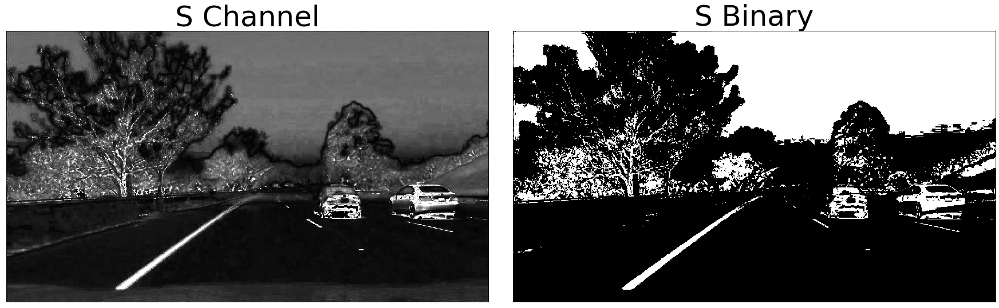

In [120]:
S_thresh = (90, 255)
S_binary = np.zeros_like(S)
S_binary[(S > S_thresh[0]) & (S <= S_thresh[1])] = 1
show_multi_images([S, S_binary], ['S Channel', 'S Binary'], 1, 2)

看看 H 通道的效果

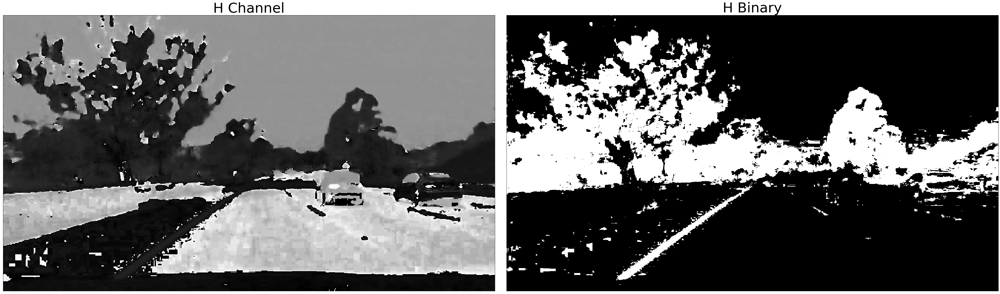

In [154]:
H_thresh = (15, 100)
H_binary = np.zeros_like(H)
H_binary[(H > H_thresh[0]) & (H <= H_thresh[1])] = 1
show_multi_images([H, H_binary], ['H Channel', 'H Binary'], 1, 2)

在上面的例子中，可以看到 `S Channel` 是最好的选择，它比 `H Channel` 和 `R Channel` 都要清晰

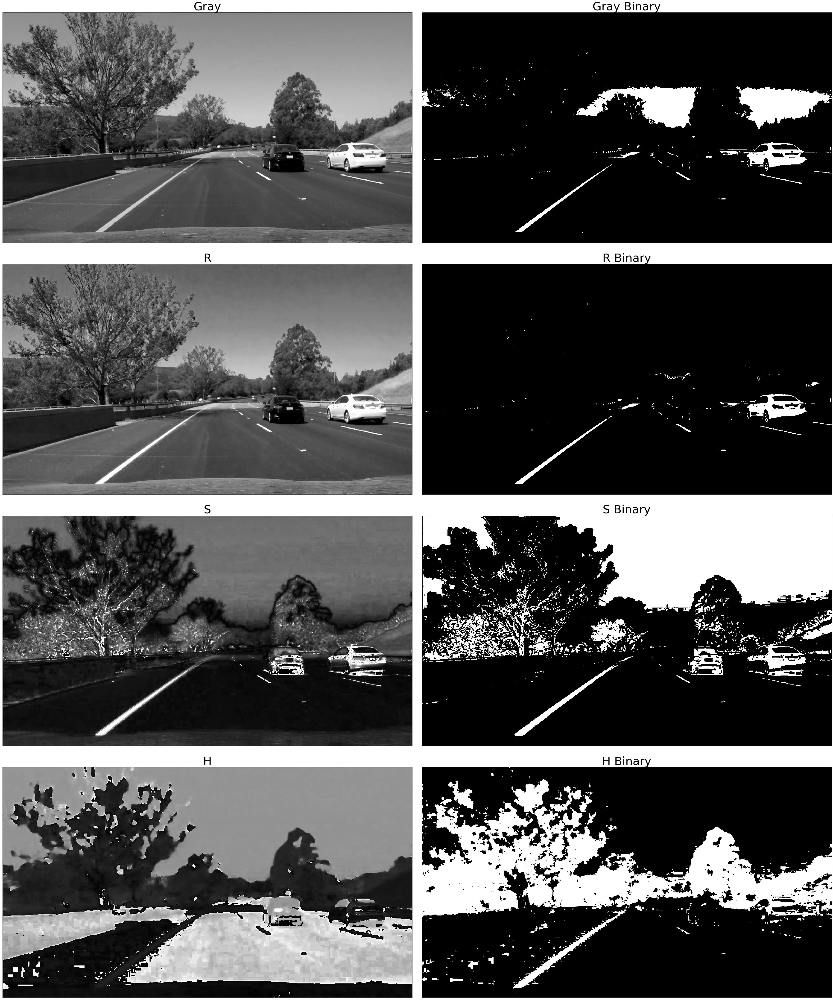

In [155]:
display = [gray, gray_binary, 
           R, R_binary, 
           S, S_binary, 
           H, H_binary]

titles = ['Gray', 'Gray Binary', 
          'R', 'R Binary', 
          'S', 'S Binary', 
          'H', 'H Binary']
show_multi_images(display, titles, 4, 2)

结论：
- S 通道整体表现最好，尤其是在不同颜色和对比度条件下
- R 通道在检测白色车道线的表现相当不错，甚至可能优于 S 通道
- 与 梯度一样，可以考虑如何组合各种颜色阈值来对车道线进行最可靠的识别

## Color and Gradient

Combine color and gradient thresholding to get the best of both worlds.

In [156]:
# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    return color_binary

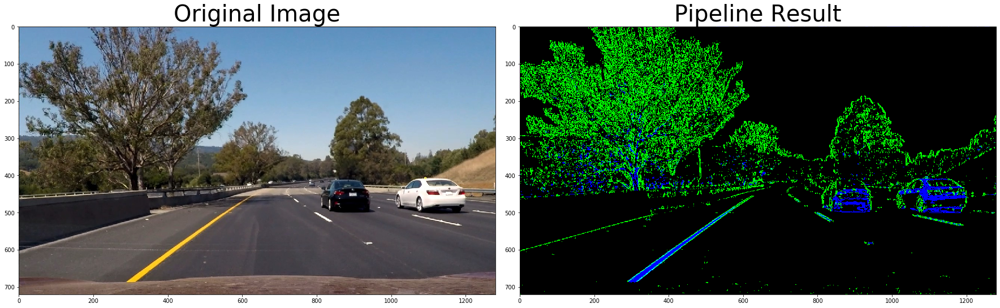

In [158]:
mage = mpimg.imread('images/bridge_shadow.jpg')

result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)